In [1]:
import tensorflow as tf
import numpy as np
import skimage.io
import sklearn.decomposition
import matplotlib.pyplot as plt
from pathlib import Path
import tqdm
from massimal import hyspec_io, hyspec_ml, preprocess, image_render
import datetime
import matplotlib.pyplot as plt

In [2]:
# Paths
hyspec_base = Path('/home/mha114/data/massimal/vega_sola/hyperspec/images/2a_rrs/')
annotation_dir = Path('/home/mha114/data/massimal/vega_sola/hyperspec/annotation/v2.1/png_gray/test/')
annotation_json = Path('/home/mha114/data/massimal/vega_sola/hyperspec/annotation/v2.1/png_gray/label_classes.json')
water_mask_dir = Path('/home/mha114/data/massimal/vega_sola/hyperspec/watermask/')
pca_model_path = Path('/home/mha114/data/massimal/vega_sola/hyperspec/pca_models/vega_sola_pca_model_original_class_dist_2024-04-28-16h26m34s.npz')
pca_im_dir = Path('/home/mha114/data/massimal/vega_sola/hyperspec/datasets/pca_images/pca_images_log_rrs_v1/test')

pca_im_dir.mkdir(parents=True,exist_ok=True)

In [3]:
# Parameters
wl_min = 400
wl_max = 730
minimum_reflectance = 0.001

In [4]:
label_image_paths = [path for path in sorted(annotation_dir.rglob('*.bip.png'))]
for path in label_image_paths: 
    print(path.stem)

Vega_SolaNW_Coast2_Pika_L_13-Crop Wavelengths.bip
Vega_SolaNW_Coast2_Pika_L_22-Crop Wavelengths.bip
Vega_SolaNW_Coast2_Pika_L_23-Crop Wavelengths.bip
Vega_SolaNW_Coast2_Pika_L_24-Crop Wavelengths.bip
Vega_SolaNW_Coast2_Pika_L_26-Crop Wavelengths.bip
Vega_SolaNW_Coast2_Pika_L_28-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_1-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_10-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_11-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_12-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_13-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_14-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_2-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_21-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_22-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_23-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_24-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_26-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_27-Crop Wavelengths.bip
Vega_SolaNW_Sound2_Pika_L_31-Crop Wavelengths.bip
Ve

In [5]:
# Load PCA model 
W_pca,X_mean,_,wl = hyspec_ml.read_pca_model(pca_model_path,include_feature_labels=True)

In [6]:
# Limit to 5 components
W_pca = W_pca[0:5]

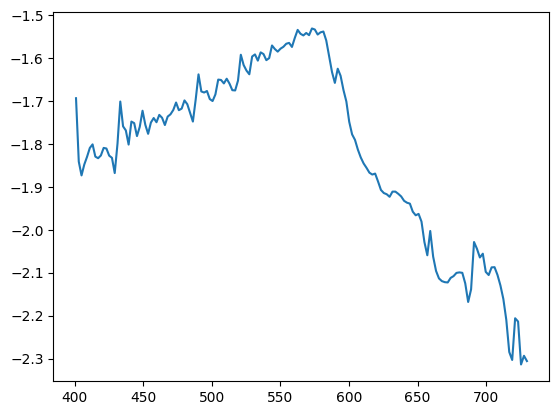

In [7]:
# Plot mean
plt.plot(wl,X_mean)
plt.show()

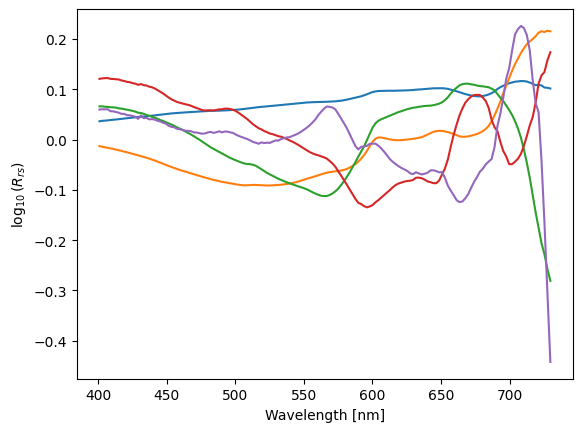

In [8]:
# Plot PCA components
plt.plot(wl,W_pca.T)
plt.xlabel('Wavelength [nm]')
plt.ylabel('$\log_{10}(R_{rs})$')
plt.show()

Processing image 1 of 41: Vega_SolaNW_Coast2_Pika_L_13-Crop Wavelengths.bip.png


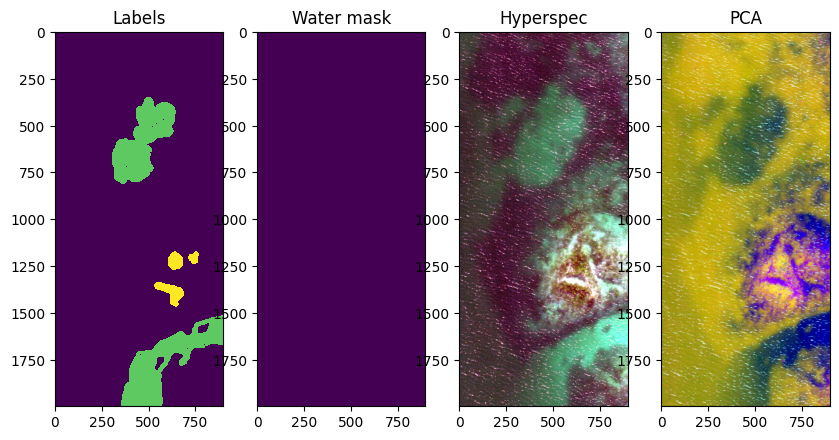

Processing image 2 of 41: Vega_SolaNW_Coast2_Pika_L_22-Crop Wavelengths.bip.png


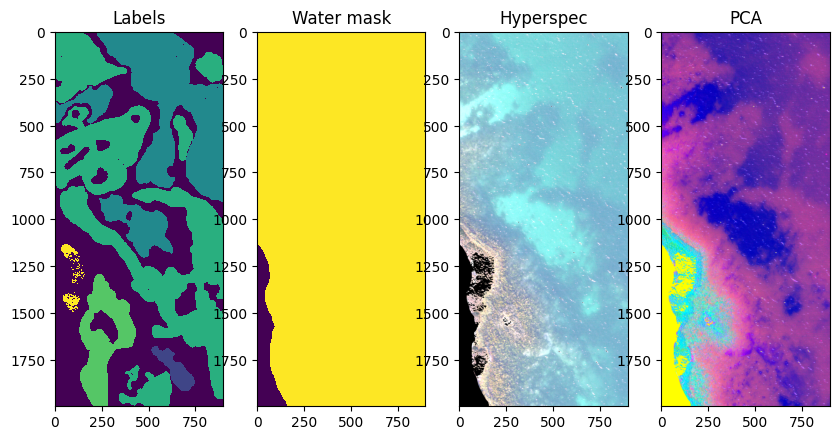

Processing image 3 of 41: Vega_SolaNW_Coast2_Pika_L_23-Crop Wavelengths.bip.png


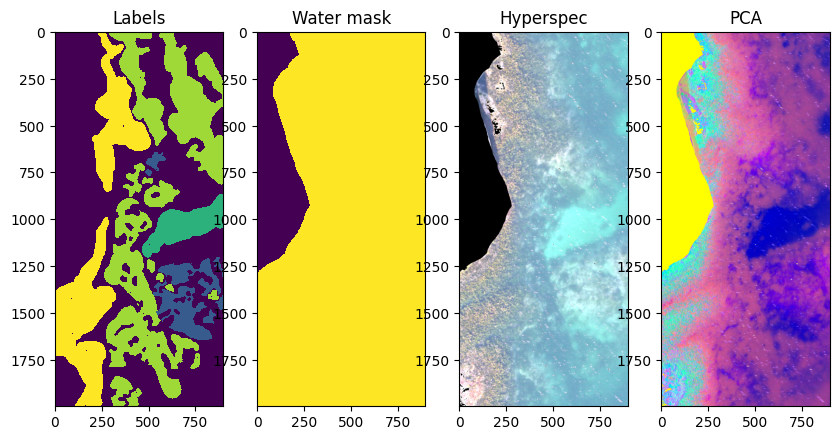

Processing image 4 of 41: Vega_SolaNW_Coast2_Pika_L_24-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


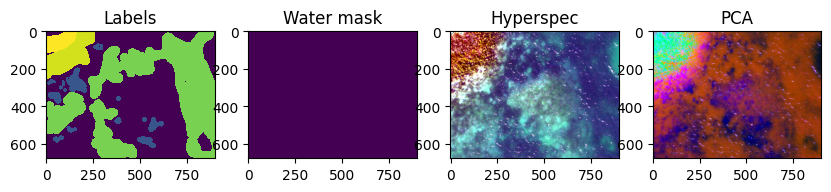

Processing image 5 of 41: Vega_SolaNW_Coast2_Pika_L_26-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


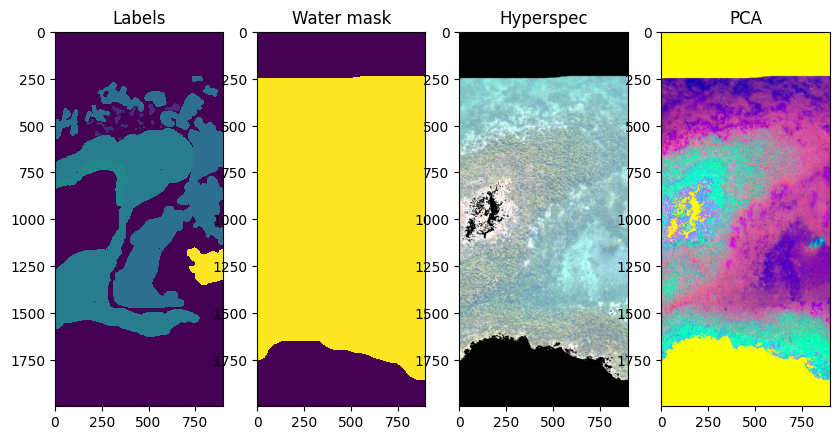

Processing image 6 of 41: Vega_SolaNW_Coast2_Pika_L_28-Crop Wavelengths.bip.png


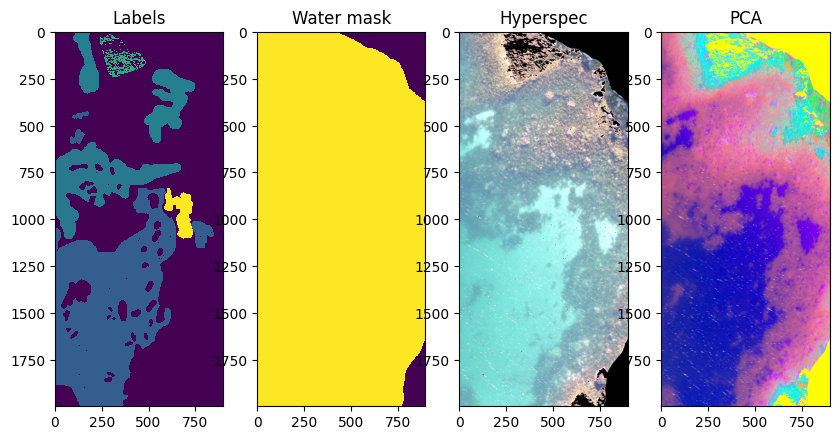

Processing image 7 of 41: Vega_SolaNW_Sound2_Pika_L_1-Crop Wavelengths.bip.png


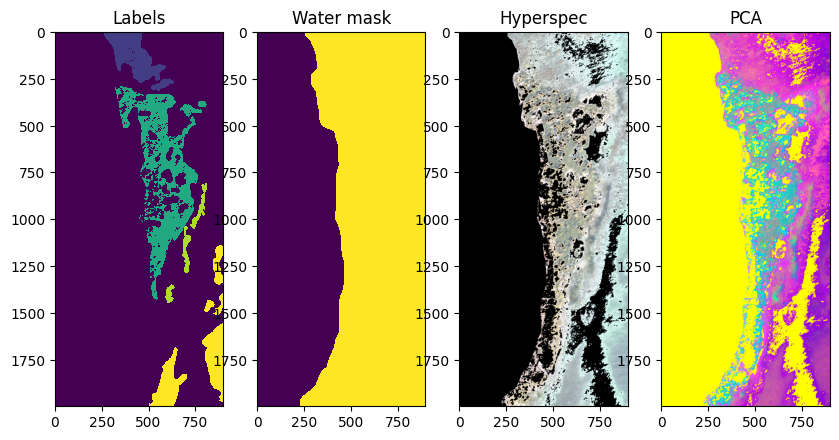

Processing image 8 of 41: Vega_SolaNW_Sound2_Pika_L_10-Crop Wavelengths.bip.png


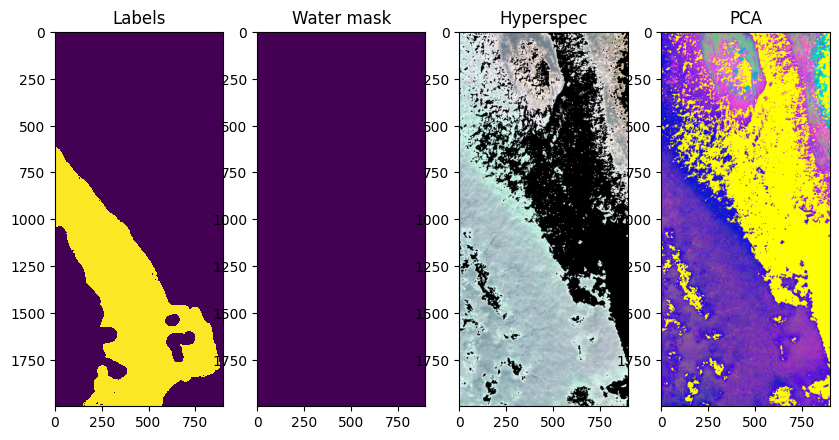

Processing image 9 of 41: Vega_SolaNW_Sound2_Pika_L_11-Crop Wavelengths.bip.png


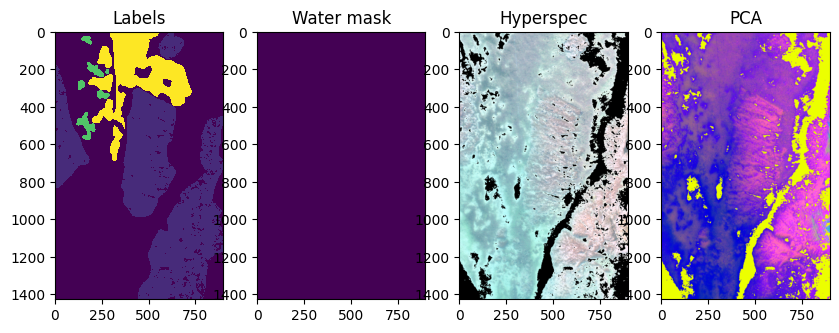

Processing image 10 of 41: Vega_SolaNW_Sound2_Pika_L_12-Crop Wavelengths.bip.png


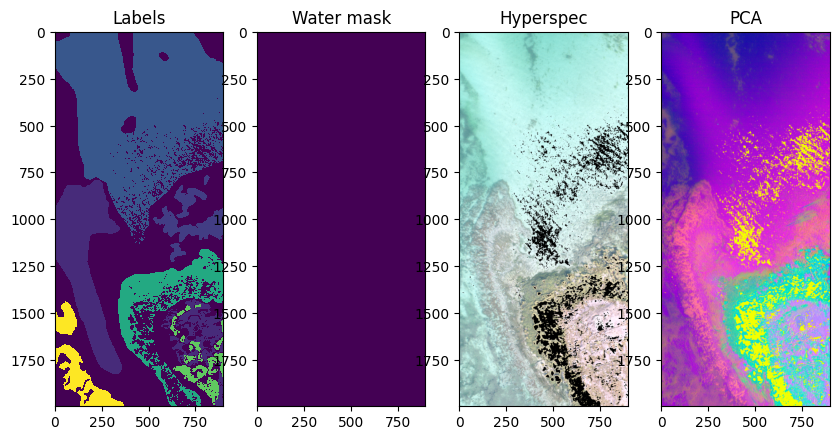

Processing image 11 of 41: Vega_SolaNW_Sound2_Pika_L_13-Crop Wavelengths.bip.png


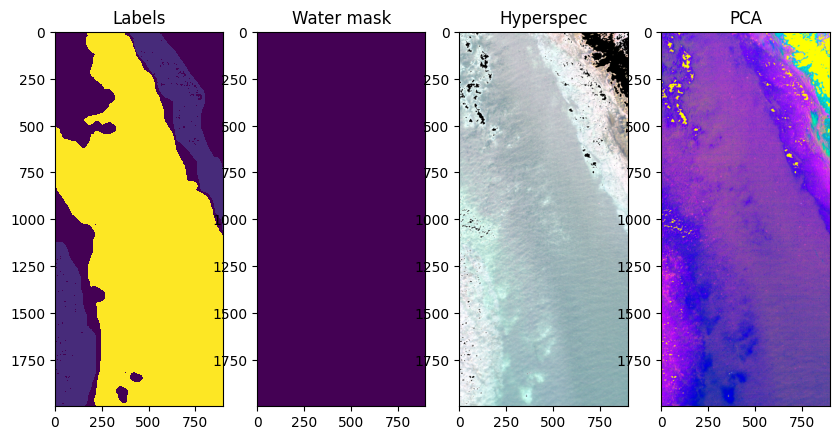

Processing image 12 of 41: Vega_SolaNW_Sound2_Pika_L_14-Crop Wavelengths.bip.png


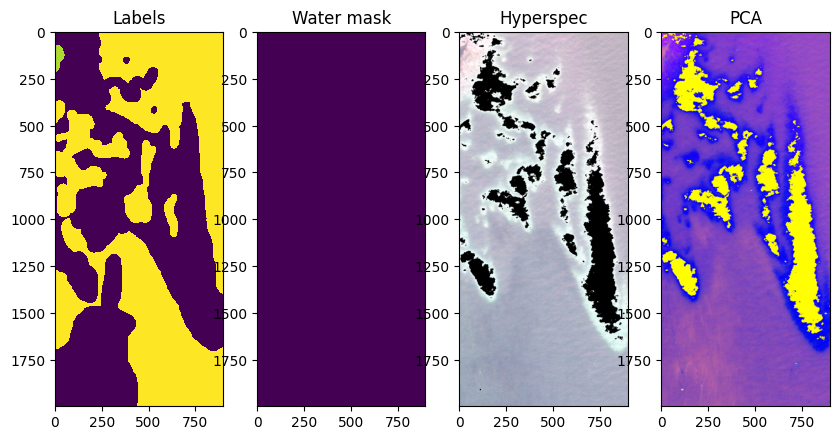

Processing image 13 of 41: Vega_SolaNW_Sound2_Pika_L_2-Crop Wavelengths.bip.png


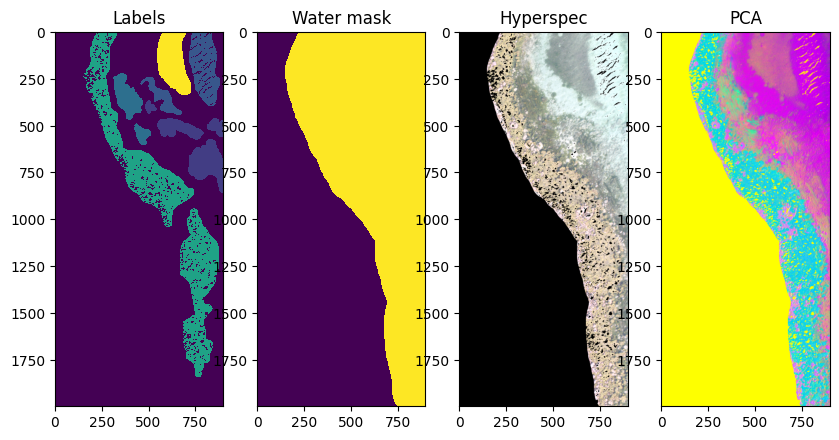

Processing image 14 of 41: Vega_SolaNW_Sound2_Pika_L_21-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


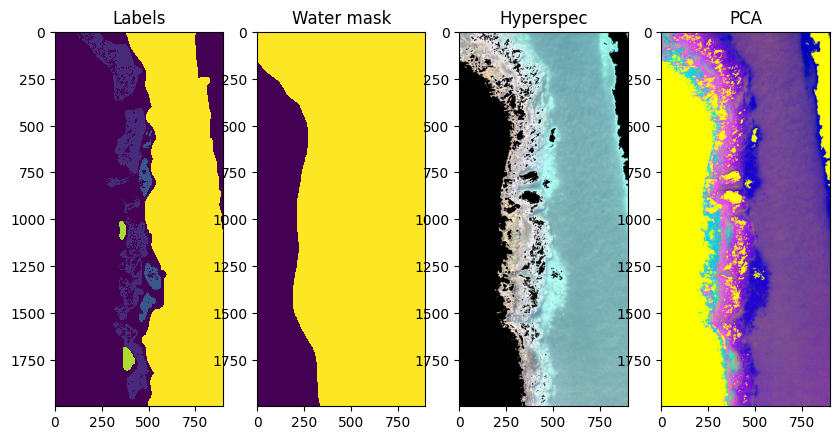

Processing image 15 of 41: Vega_SolaNW_Sound2_Pika_L_22-Crop Wavelengths.bip.png


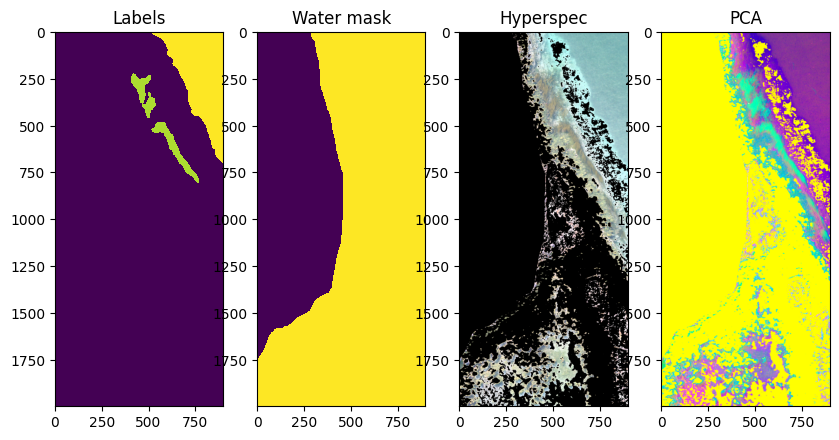

Processing image 16 of 41: Vega_SolaNW_Sound2_Pika_L_23-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


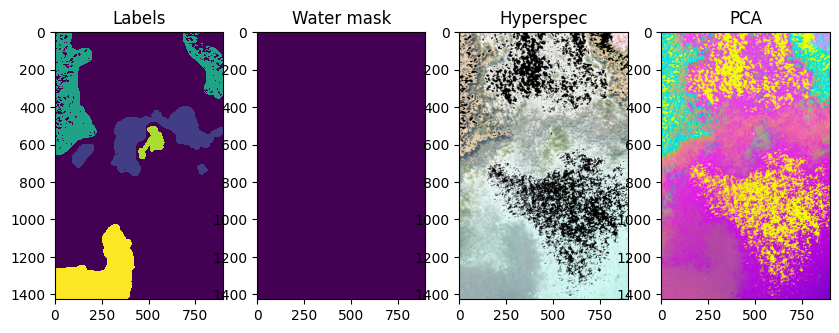

Processing image 17 of 41: Vega_SolaNW_Sound2_Pika_L_24-Crop Wavelengths.bip.png


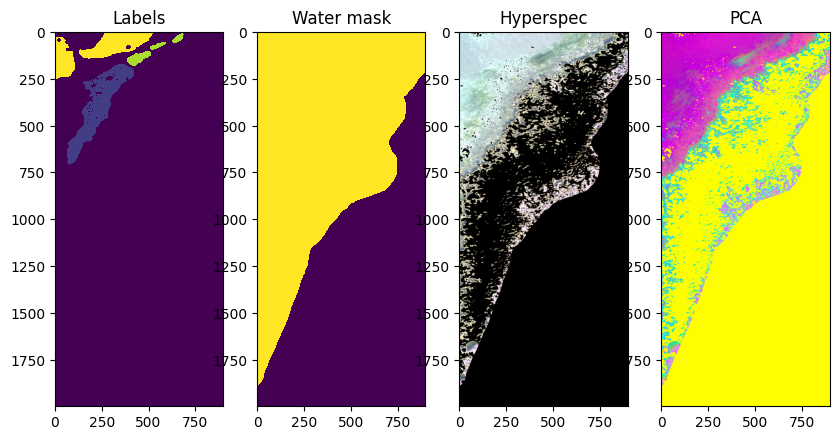

Processing image 18 of 41: Vega_SolaNW_Sound2_Pika_L_26-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


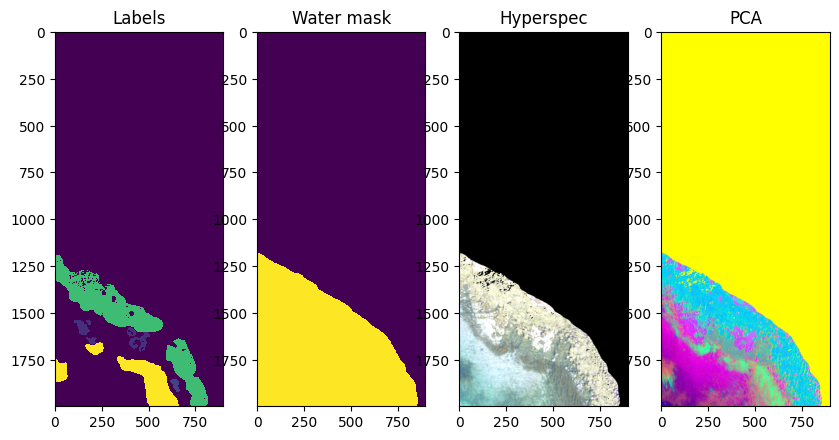

Processing image 19 of 41: Vega_SolaNW_Sound2_Pika_L_27-Crop Wavelengths.bip.png


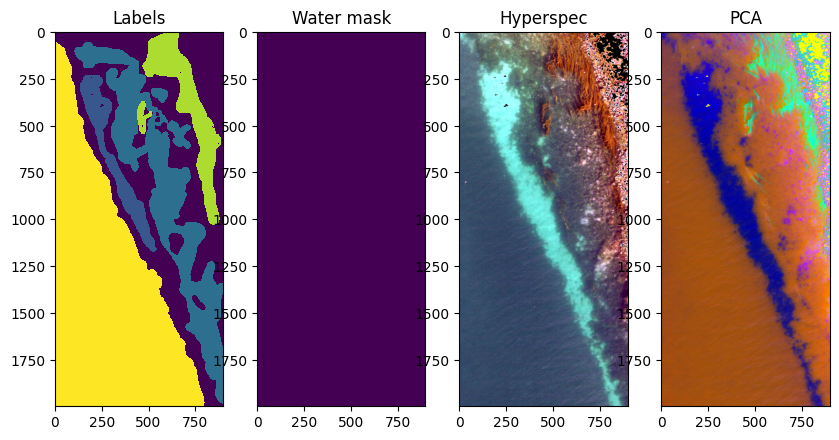

Processing image 20 of 41: Vega_SolaNW_Sound2_Pika_L_31-Crop Wavelengths.bip.png


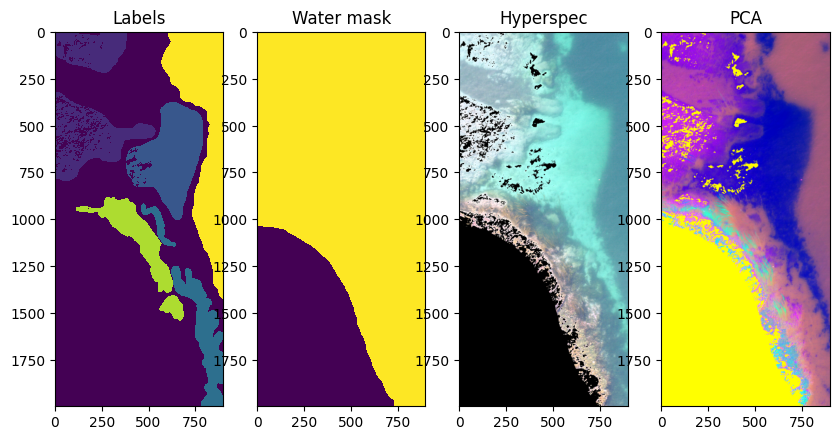

Processing image 21 of 41: Vega_SolaNW_Sound2_Pika_L_32-Crop Wavelengths.bip.png


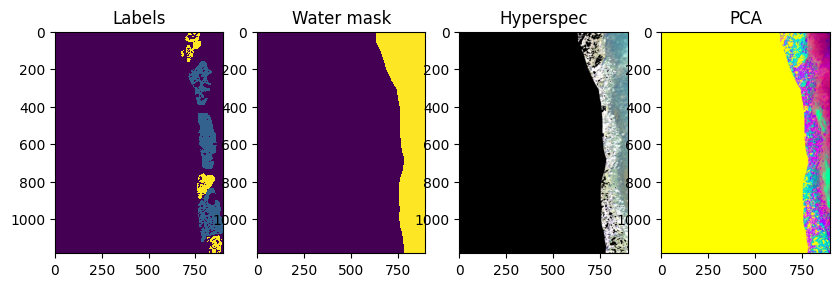

Processing image 22 of 41: Vega_SolaNW_Sound2_Pika_L_4-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


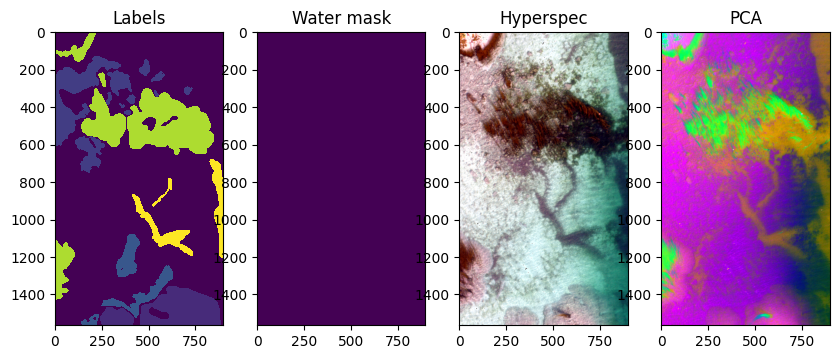

Processing image 23 of 41: Vega_SolaNW_Sound2_Pika_L_6-Crop Wavelengths.bip.png


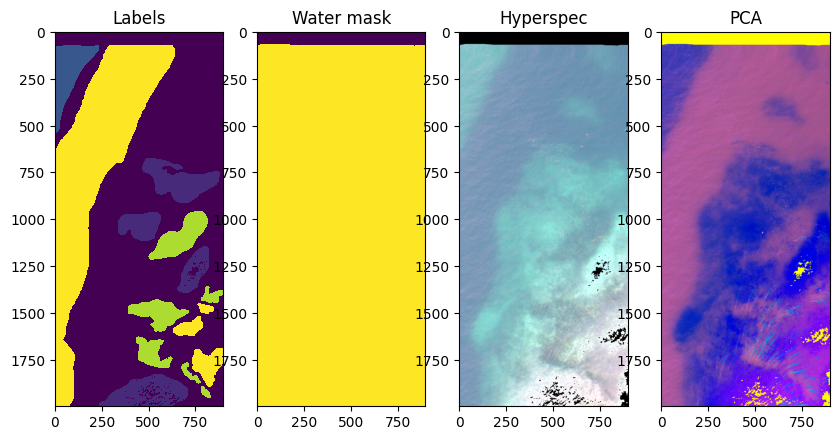

Processing image 24 of 41: Vega_SolaNW_Sound2_Pika_L_7-Crop Wavelengths.bip.png


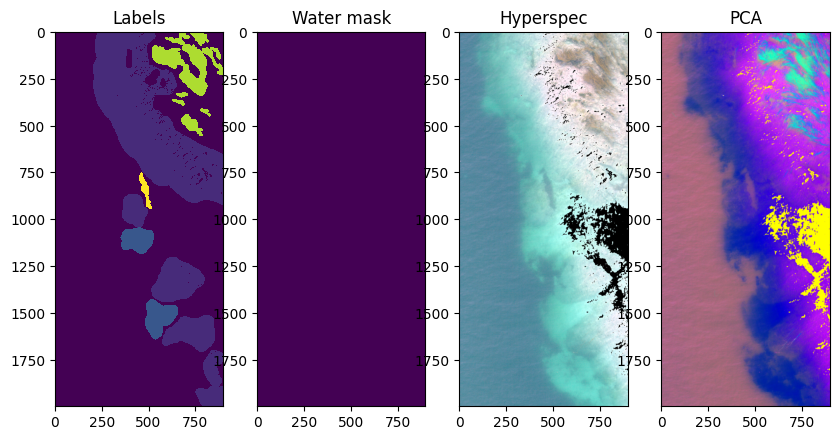

Processing image 25 of 41: Vega_SolaNW_Sound2_Pika_L_8-Crop Wavelengths.bip.png


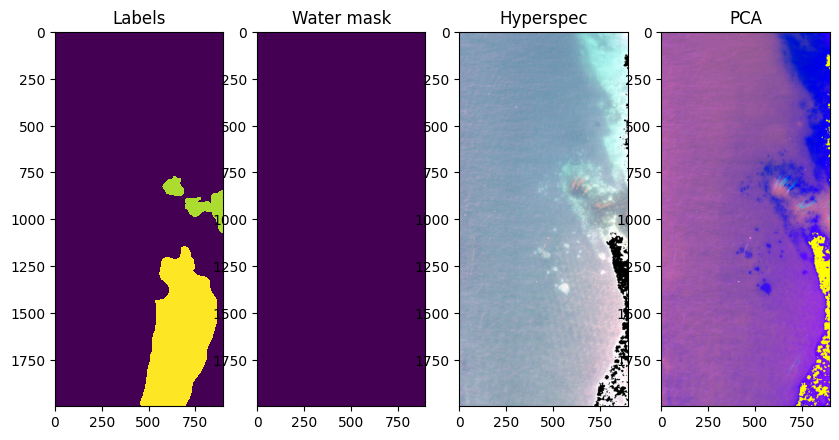

Processing image 26 of 41: Vega_SolaNW_Sound2_Pika_L_9-Crop Wavelengths.bip.png


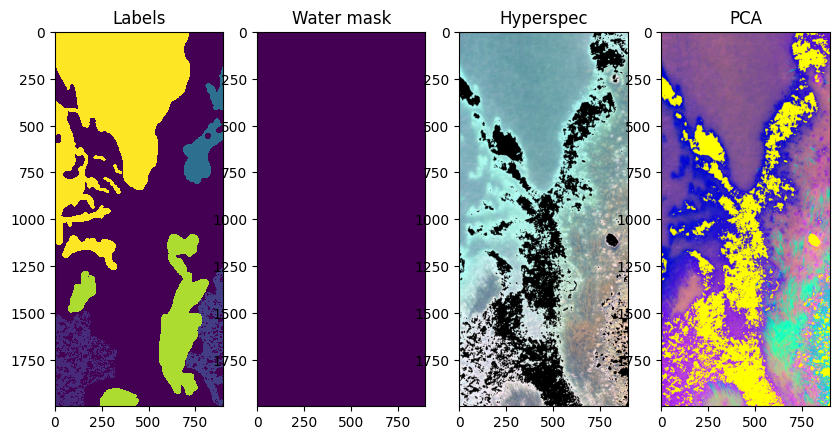

Processing image 27 of 41: Vega_SolaNW_Sound3b_Pika_L_1-Crop Wavelengths.bip.png


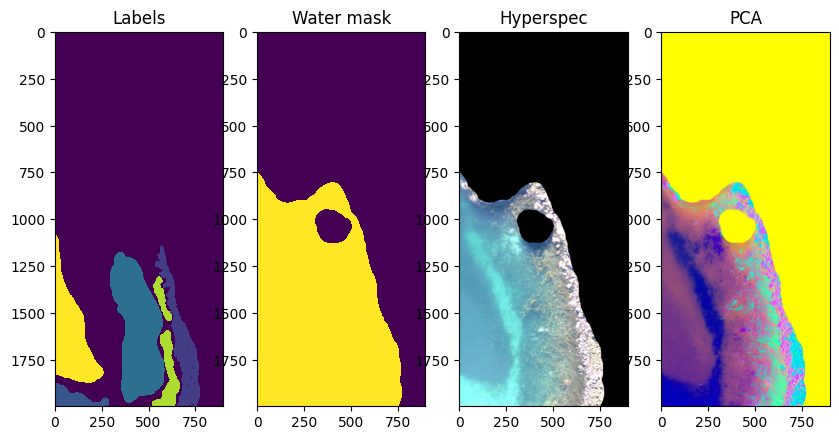

Processing image 28 of 41: Vega_SolaNW_Sound3b_Pika_L_13-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


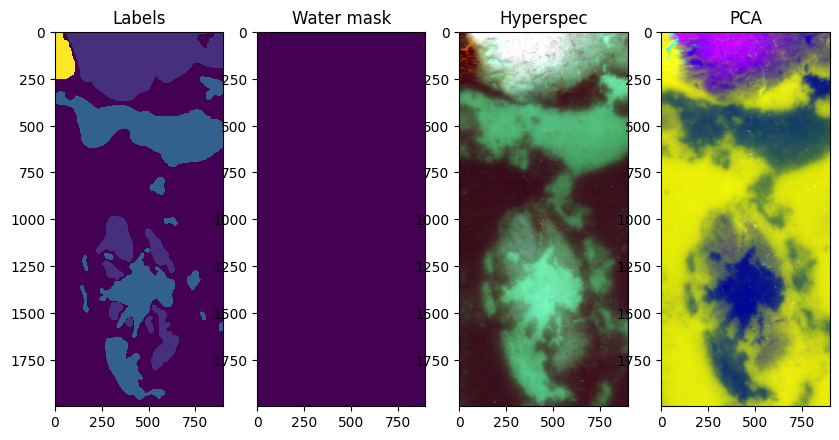

Processing image 29 of 41: Vega_SolaNW_Sound3b_Pika_L_15-Crop Wavelengths.bip.png


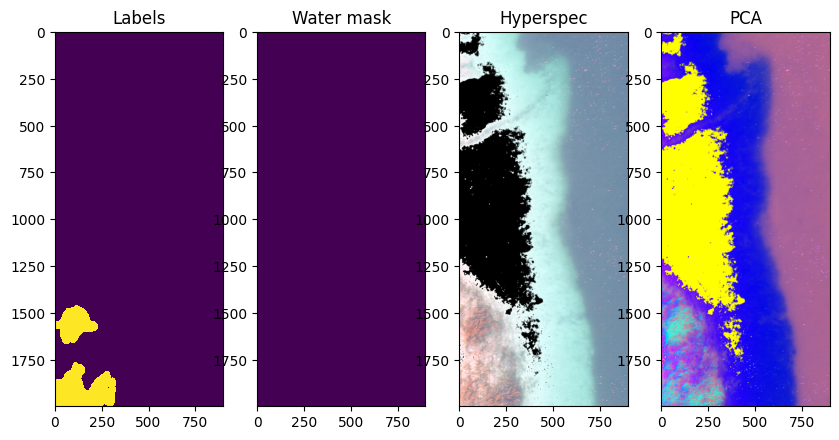

Processing image 30 of 41: Vega_SolaNW_Sound3b_Pika_L_17-Crop Wavelengths.bip.png


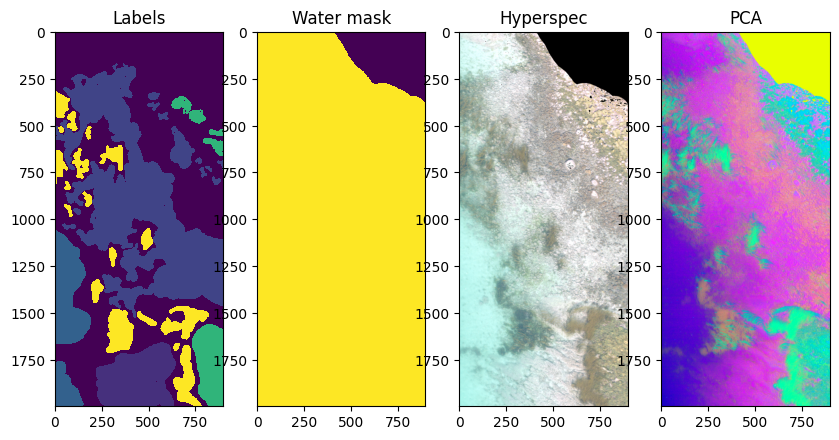

Processing image 31 of 41: Vega_SolaNW_Sound3b_Pika_L_18-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


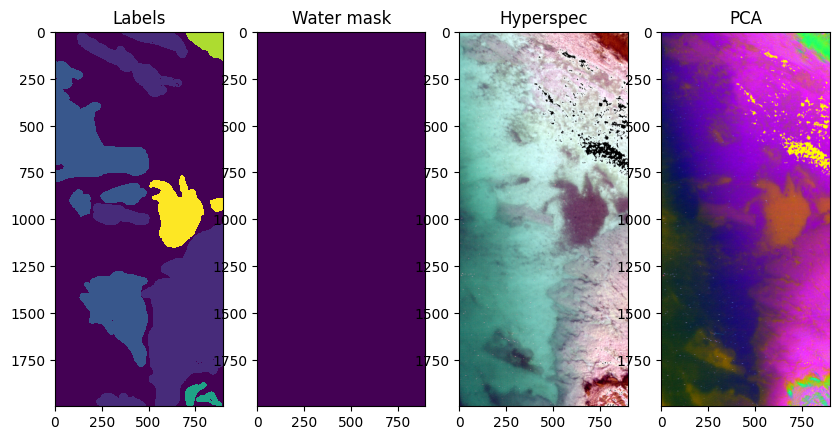

Processing image 32 of 41: Vega_SolaNW_Sound3b_Pika_L_19-Crop Wavelengths.bip.png


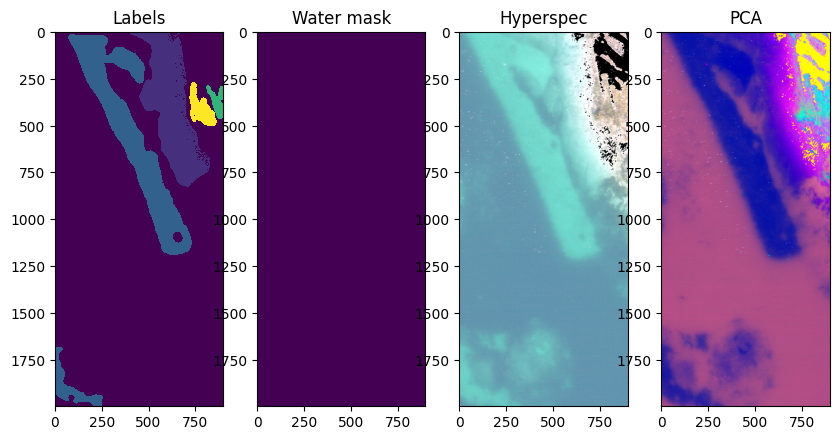

Processing image 33 of 41: Vega_SolaNW_Sound3b_Pika_L_2-Crop Wavelengths.bip.png


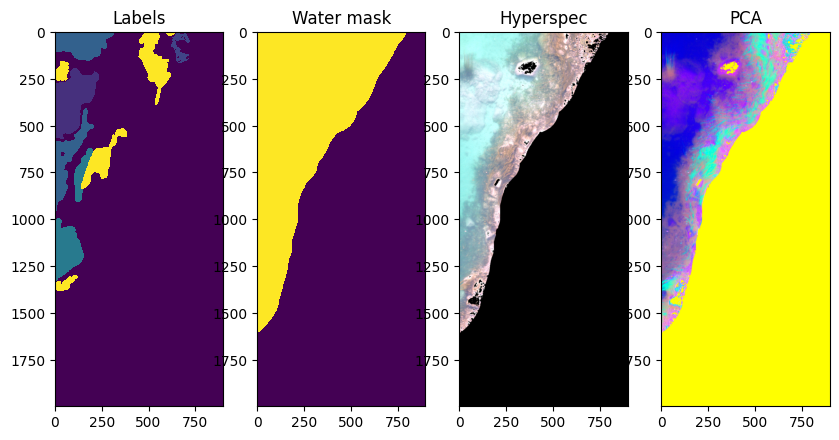

Processing image 34 of 41: Vega_SolaNW_Sound3b_Pika_L_20-Crop Wavelengths.bip.png


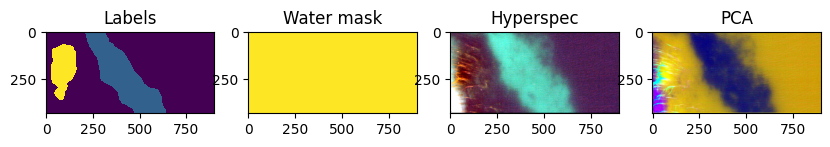

Processing image 35 of 41: Vega_SolaNW_Sound3b_Pika_L_22-Crop Wavelengths.bip.png


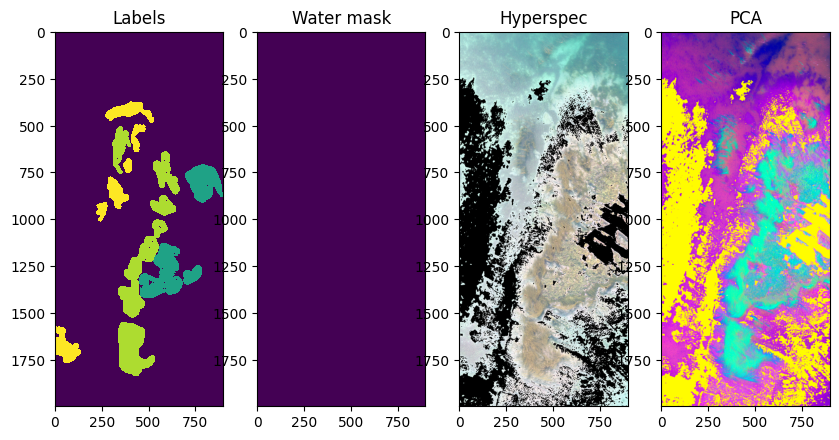

Processing image 36 of 41: Vega_SolaNW_Sound3b_Pika_L_23-Crop Wavelengths.bip.png


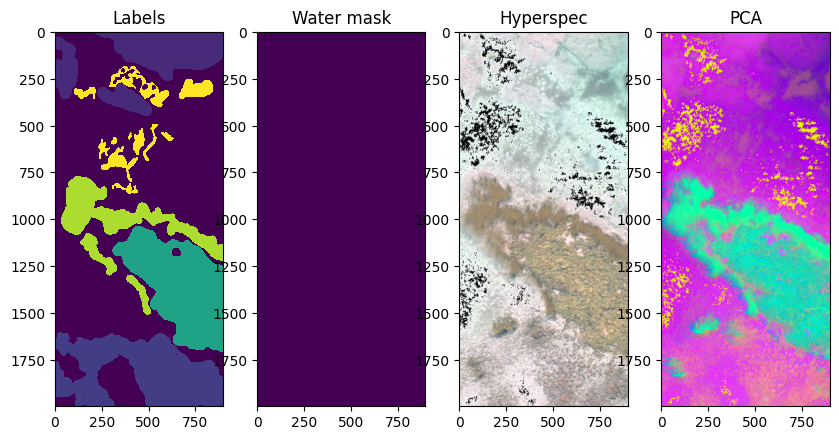

Processing image 37 of 41: Vega_SolaNW_Sound3b_Pika_L_24-Crop Wavelengths.bip.png


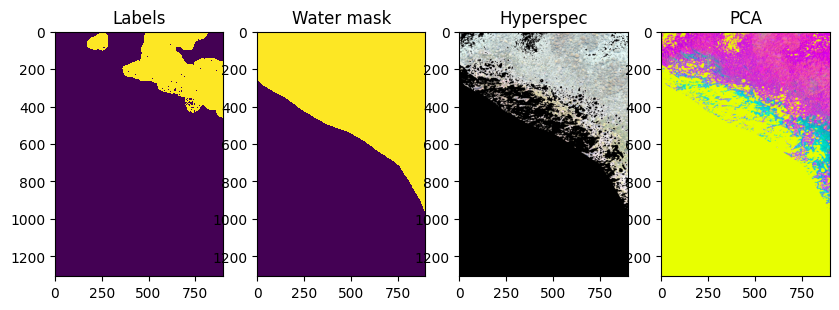

Processing image 38 of 41: Vega_SolaNW_Sound3b_Pika_L_25-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


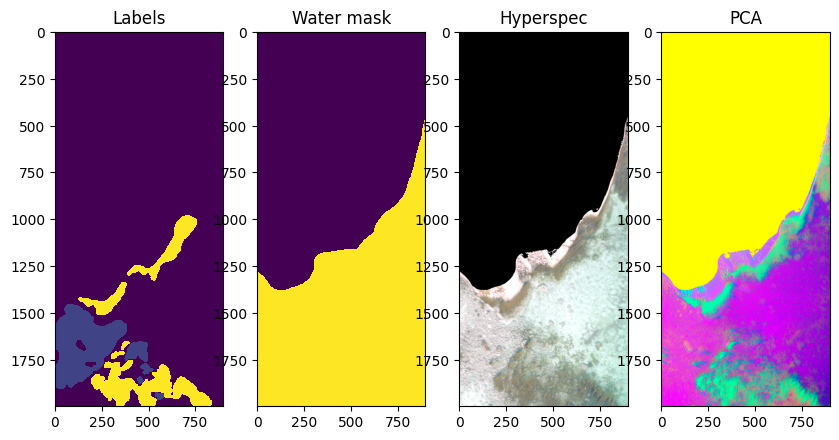

Processing image 39 of 41: Vega_SolaNW_Sound3b_Pika_L_26-Crop Wavelengths.bip.png


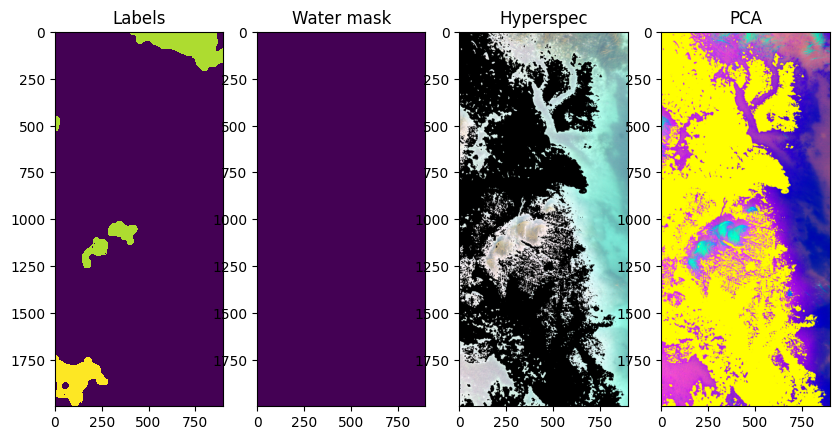

Processing image 40 of 41: Vega_SolaNW_Sound3b_Pika_L_27-Crop Wavelengths.bip.png


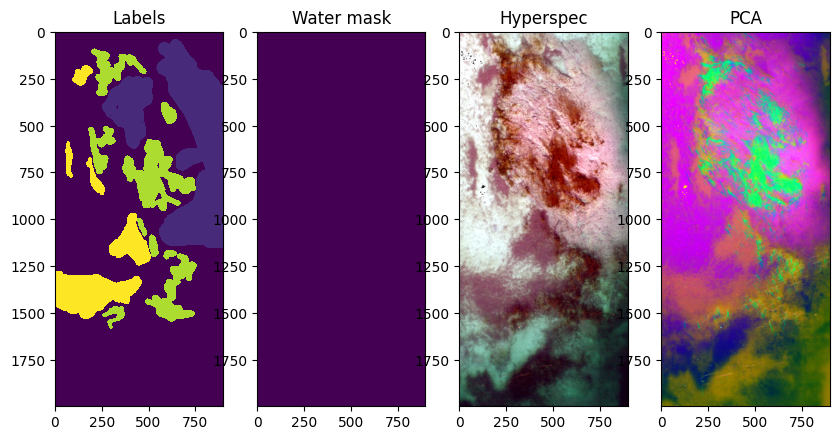

Processing image 41 of 41: Vega_SolaNW_Sound3b_Pika_L_5-Crop Wavelengths.bip.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


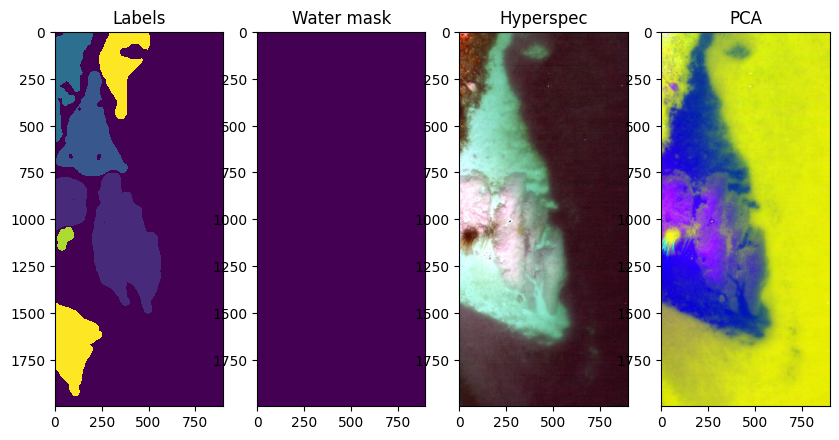

In [9]:
# Loop over images, PCA transform, inpaint, save
for i,label_image_path in enumerate(label_image_paths):
    print(f'Processing image {i+1} of {len(label_image_paths)}: {label_image_path.name}')
    hyspec_image_path = [path for path in hyspec_base.rglob(label_image_path.stem+'*.hdr')][0]
    water_mask_path = [path for path in water_mask_dir.rglob(label_image_path.stem+'*.png')][0]

    # Read images
    label_image = skimage.io.imread(label_image_path)
    water_mask_image = np.expand_dims(skimage.io.imread(water_mask_path),axis=2)
    
    # Load hyperspectral image, apply water mask
    (hyspec_image,wl,rgb_ind,_) = hyspec_io.load_envi_image(str(hyspec_image_path))
    hyspec_image = hyspec_image*water_mask_image
    
    # Set labels for zero-valued pixels to background
    label_image[np.all(hyspec_image==0,axis=2)] = 0
    
    # Limit wavelength range, calculate logarithmic values for reflectance
    wl_ind = (wl>=wl_min) & (wl<=wl_max)
    hyspec_image[hyspec_image<minimum_reflectance] = minimum_reflectance
    hyspec_image = np.log10(hyspec_image[:,:,wl_ind])

    # Create PCA image
    im_pca = hyspec_ml.pca_transform_image(hyspec_image,W_pca,X_mean)
    
    # Inpaint PCA image
    im_pca_inpaint = preprocess.inpaint_missing_pixels(im_pca)

    # Plot images
    fig,ax = plt.subplots(ncols=4,figsize=(10,6))
    ax[0].imshow(label_image,interpolation='none')
    ax[1].imshow(water_mask_image,interpolation='none')
    ax[2].imshow(image_render.percentile_stretch(hyspec_image[:,:,rgb_ind]))
    ax[3].imshow(image_render.percentile_stretch(im_pca_inpaint[:,:,(2,1,0)]))
    for current_ax, title in zip(ax,['Labels','Water mask','Hyperspec','PCA']):
        current_ax.set_title(title)
    plt.show()
    
    # Save as tensorflow dataset
    dataset = tf.data.Dataset.from_tensors((im_pca_inpaint,label_image))  # Use tf.data.Dataset.concatenate to merge later
    dataset_save_path = pca_im_dir / label_image_path.stem
    tf.data.experimental.save(dataset, path=str(dataset_save_path))


In [10]:
# Try loading last saved dataset
loaded_dataset = tf.data.experimental.load(str(dataset_save_path))
print(loaded_dataset)

<_LoadDataset element_spec=(TensorSpec(shape=(2000, 900, 5), dtype=tf.float32, name=None), TensorSpec(shape=(2000, 900), dtype=tf.uint8, name=None))>
